In [202]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

In [203]:
# retrieve data from aec2 assays and calculate mean values for each hours (values < 0 are NA)
df = pd.read_csv("datasets/uptake_data-aec2_assays.csv")
hours2 = df["2 hrs"]
hours2mean = hours2[hours2 >= 0].mean()/100
hours4 = df["4 hrs"]
hours4mean = hours4[hours4 >= 0].mean()/100
hours6 = df["6 hrs"]
hours6mean = hours6[hours6 >= 0].mean()/100

In [204]:
# objective function (MSE) for screening of optimal uptake rate
def objf(Alives):
    ss = 0
    ss += ((1 - Alives[int(1+(2*60)/dt)] - np.array(hours2[hours2 >= 0]/100))**2).mean() 
    ss += ((1 - Alives[int(1+(4*60)/dt)] - np.array(hours4[hours4 >= 0]/100))**2).mean() 
    ss += ((1 - Alives[int(1+(6*60)/dt)] - np.array(hours6[hours6 >= 0]/100))**2).mean()
    return ss/3

In [205]:
# Parameters from Diameter ODE Model
#x: array([0.03731051, 0.00531323, 1.84056146, 2.78099417])

r_sw = 0.0373
dia0 = 0.0053
C = 1.84
D0 = 2.78

area0 = np.pi*((D0 + dia0)/2)**2

# ODE Model for uptake by AEC2
def dDiam(r, Diam):
    return r * Diam * (1 - Diam/C)
    
def dAlive(raec2, Alive, Diam):
    return - raec2 * (((Diam+D0)*(Diam+D0))/((dia0 + D0)*(dia0 + D0))) * Alive

def diamEuler(dt, Diam, r):
    Diam = Diam + dt * dDiam(r, Diam)
    return Diam

raec2 = 0.00137

opt_val = 10000
opt_raec2 = 0

# screen over uptake values 
for raec2 in np.arange(0.001, 0.002, 0.00001):
    
    # Run euler to solve system of ODEs for certain raec2
    Diams = [dia0]
    AreaIncrease = [area0]
    Alives = [1.0]
    r_ = r_sw
    
    dt = 0.1
    tmax = 8 * 60
    for t in np.arange(0, tmax-dt, dt):
        Diam = Diams[-1] + dt * dDiam(r_, Diams[-1])
        Alive = Alives[-1] + dt * dAlive(raec2, Alives[-1],Diam)       

        Diams.append(Diam)
        Alives.append(Alive)
        AreaIncrease.append((((Diam+D0)*(Diam+D0))/4)*np.pi)#/((dia0 + D0) * (dia0 + D0))))

    error = objf(Alives)
    
    if error < opt_val:
        opt_val = error
        opt_raec2 = raec2

print(opt_raec2, " - MSE =", opt_val)
        
# Screen over values
# found raec2 = 0.00137 as best values

0.001370000000000001  - MSE = 0.09744635248965623


In [212]:
# bootstrap method for confidence bands

n=1000
results_paras = np.zeros(n)
results_predictions = np.zeros((n,4800))
for i in range(n):
    hours2i = np.random.choice(hours2, size=len(hours2), replace=True)
    hours4i = np.random.choice(hours4, size=len(hours4), replace=True)
    hours6i = np.random.choice(hours6, size=len(hours6), replace=True)
    
    def objf_temp(Alives):
        ss = 0
        ss += ((1 - Alives[int(1+(2*60)/dt)] - np.array(hours2i[hours2i >= 0]/100))**2).mean() 
        ss += ((1 - Alives[int(1+(4*60)/dt)] - np.array(hours4i[hours4i >= 0]/100))**2).mean() 
        ss += ((1 - Alives[int(1+(6*60)/dt)] - np.array(hours6i[hours6i >= 0]/100))**2).mean()
        return ss/3
    
    opt_val = 10000
    opt_raec2 = 0
    # screen over uptake values 
    for raec2 in np.arange(0.0005, 0.003, 0.00001):

        # Run euler to solve system of ODEs for certain raec2
        Diams = [dia0]
        AreaIncrease = [area0]
        Alives = [1.0]
        r_ = r_sw

        dt = 0.1
        tmax = 8 * 60
        for t in np.arange(0, tmax-dt, dt):
            Diam = Diams[-1] + dt * dDiam(r_, Diams[-1])
            Alive = Alives[-1] + dt * dAlive(raec2, Alives[-1],Diam)       

            Diams.append(Diam)
            Alives.append(Alive)
            AreaIncrease.append((((Diam+D0)*(Diam+D0))/4)*np.pi)#/((dia0 + D0) * (dia0 + D0))))

        error = objf_temp(Alives)
        #print("i =", i, ": ", raec2, " - MSE =", error)

        
        if error < opt_val:
            opt_val = error
            results_paras[i] = raec2
            results_predictions[i] = 100-np.array(Alives)*100
    print(i, end=", ")
    #print("i =", i, ": ", results_paras[i], " - MSE =", opt_val)

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 

In [213]:
bootstrap_predictions = np.array(results_predictions)
residualsLOW = np.percentile(bootstrap_predictions, 2.5, axis=0)
residualsUP = np.percentile(bootstrap_predictions, 97.5, axis=0)

In [225]:
print("[",np.percentile(results_paras, 2.5),",", np.percentile(results_paras, 97.5),"]")

[ 0.0011700000000000018 , 0.001610000000000003 ]


# Run model and plot curve

In [215]:
# Parameters from Diameter ODE Model
#x: array([0.0373, 0.0053, 1.84, 2.78])
r_sw = 0.0373
dia0 = 0.0053
C = 1.84
D0 = 2.78
area0 = np.pi*((D0 + dia0)/2)**2

# ODE Model for uptake by AEC2
def dDiam(r, Diam):
    return r * Diam * (1 - Diam/C)
    
def dAlive(raec2, Alive, Diam):
    return - raec2 * (((Diam+D0)*(Diam+D0))/((dia0 + D0)*(dia0 + D0))) * Alive

def diamEuler(dt, Diam, r):
    Diam = Diam + dt * dDiam(r, Diam)
    return Diam

# screened value for uptake rate for AEC2s
raec2 = 0.00137#0.0006303#137/10# opt_raec2

# Run euler to solve system of ODEs
Diams = [dia0]
AreaIncrease = [area0]
Alives = [1.0]
r_ = r_sw
dt = 0.1
tmax = 8 * 60
for t in np.arange(0, tmax-dt, dt):
    Diam = Diams[-1] + dt * dDiam(r_, Diams[-1])
    dA = dAlive(raec2, Alives[-1],Diam)     
    Alive = Alives[-1] + dt * dA 
    #print(t, st)
    Diams.append(Diam)
    Alives.append(Alive)
    AreaIncrease.append((((Diam+D0)*(Diam+D0))/4)*np.pi)#/((dia0 + D0) * (dia0 + D0))))

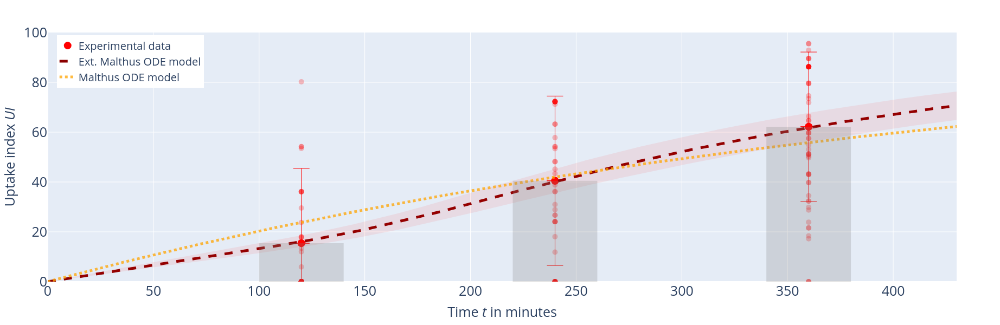

In [217]:
fig = px.scatter(x=np.array([120]), y=[-5.145], height=600, width=900, range_y=[0,100], range_x=[0, 430])

# e function for diameter independent model
def efun(r, t, deltaT):
    return (1-np.exp(-r * np.array(t/deltaT)))*100

showleg = True
xvals = np.arange(0,500, 1)

# Add datapoints of Bertuzzi
fig.add_trace(go.Scatter(x=np.ones(len(hours2))*120, y=hours2, mode='markers', marker=dict(size=10, color='red', opacity=0.25), name='Experimental data',  showlegend=False))
fig.add_trace(go.Scatter(x=np.ones(len(hours4))*240, y=hours4, mode='markers', marker=dict(size=10, color='red', opacity=0.25),  showlegend=False))
fig.add_trace(go.Scatter(x=np.ones(len(hours6))*360, y=hours6, mode='markers', marker=dict(size=10, color='red', opacity=0.25),  showlegend=False))

# Add mean values of datapoints of Bertuzzi
fig.add_trace(go.Scatter(x=np.array([120,120,120, 240,240,240, 360,360,360]), y=100*np.array([hours2mean, hours2mean, hours2mean, hours4mean, hours4mean, hours4mean, hours6mean, hours6mean, hours6mean]), error_y=dict(
        type='data',  # Data means it's an array of values, not a percentage or constant value
        array=np.array([0,30,0,0 ,34,0,0, 30,0]),
        visible=True,
        thickness=1.0,
        width=15
    ), mode='markers', marker=dict(size=14, color='red'),  name='Experimental data',  showlegend=True))

# Add models 
fig.add_trace(go.Line(x=np.arange(0, tmax, dt), y=100-np.array(Alives)*100, mode='lines',line=dict(color='darkred', width=5, dash="dash"),  name='Ext. Malthus ODE model', showlegend=showleg))

XX1 = np.arange(0, tmax-dt, dt)
fig.add_trace(go.Scatter(
    x=np.concatenate([XX1, XX1[::-1]]),
    y=np.concatenate([residualsUP, residualsLOW[::-1]]),
    fill='toself',
    fillcolor='rgba(255, 0, 0, 0.08)',
    line=dict(color='rgba(255,255,255,0)'),
    showlegend=False,
    name='Model uncertainty'
))

#fig.add_trace(go.Scatter(x=xvals, y=efun(0.00216, xvals, 1), name="r<sub>c-up</sub> = 0.00216 <i>min<sup>-1</sup></i>", opacity=0.25,  mode='lines',line=dict(dash='dot', color='orange', width=4)))
fig.add_trace(go.Scatter(x=xvals, y=efun(0.00227, xvals, 1), name="Malthus ODE model",  opacity=0.75, mode='lines',line=dict(dash='dot', color='orange', width=5)))
#fig.add_trace(go.Scatter(x=xvals, y=efun(0.0014, xvals, 1), name="r<sub>c-up</sub> = 0.0014 <i>min<sup>-1</sup></i>", opacity=0.15, mode='lines',line=dict(dash='dot', color='green', width=4)))


# Add bars
fig.add_shape(type="rect",x0=100,y0=0,x1=140,y1=hours2mean*100,line_width=0, fillcolor="grey", opacity=0.25)
fig.add_shape(type="rect",x0=220,y0=0,x1=260,y1=hours4mean*100,line_width=0, fillcolor="grey", opacity=0.25)
fig.add_shape(type="rect",x0=340,y0=0,x1=380,y1=hours6mean*100,line_width=0, fillcolor="grey", opacity=0.25)

fig.update_layout(
    xaxis_title="Time <i>t</i> in minutes",
    yaxis_title="Uptake index <i>UI</i>",
    font=dict(size=20),  # Change this value as needed to adjust the font size
    xaxis=dict(tickfont=dict(size=25), title_font=dict(size=25)),
    yaxis=dict(tickfont=dict(size=25), title_font=dict(size=25)),
    legend=dict(x=0.01, y=0.99),
    showlegend=True,
    title_text="",  # No title
)

fig.show()
#fig.write_image("Figure2C_NEW.png")

# Sensitivity

In [31]:
# Parameters from Diameter ODE Model
#x: array([0.03731051, 0.00531323, 1.84056146, 2.78099417])

#backup values
r_sw_bu = 0.0373
dia0_bu = 0.0053
C_bu = 1.84
D0_bu = 2.78

para_vals = np.zeros((4,7))
para_MSEs = np.zeros((4,7))
para_Alives = []

for i in range(4):
    j=0
    for percval in [0.15, 0.1, 0.05, 0.0, -0.05, -0.1, -0.15]:
        paras = [r_sw_bu, dia0_bu, C_bu, D0_bu]
        paras[i] += percval * paras[i]
        r_sw, dia0, C, D0 = paras
    
        area0 = np.pi*((D0 + dia0)/2)**2

        # ODE Model for uptake by AEC2
        def dDiam(r, Diam):
            return r * Diam * (1 - Diam/C)

        def dAlive(raec2, Alive, Diam):
            return - raec2 * (((Diam+D0)*(Diam+D0))/((dia0 + D0)*(dia0 + D0))) * Alive

        def diamEuler(dt, Diam, r):
            Diam = Diam + dt * dDiam(r, Diam)
            return Diam

        raec2 = 0.00137

        opt_val = 10000
        opt_raec2 = 0
        opt_Alives = 0

        # screen over uptake values 
        for raec2 in np.arange(0.001, 0.002, 0.00001):

            # Run euler to solve system of ODEs for certain raec2
            Diams = [dia0]
            AreaIncrease = [area0]
            Alives = [1.0]
            r_ = r_sw

            dt = 0.1
            tmax = 8 * 60
            for t in np.arange(0, tmax-dt, dt):
                Diam = Diams[-1] + dt * dDiam(r_, Diams[-1])
                Alive = Alives[-1] + dt * dAlive(raec2, Alives[-1],Diam)       

                Diams.append(Diam)
                Alives.append(Alive)
                AreaIncrease.append((((Diam+D0)*(Diam+D0))/4)*np.pi)#/((dia0 + D0) * (dia0 + D0))))

            error = objf(Alives)

            if error < opt_val:
                opt_val = error
                opt_raec2 = raec2
                opt_Alives = Alives.copy()

        #print(i, percval, " ### ", opt_raec2, " - MSE =", opt_val)
        
        para_vals[i][j] = opt_raec2
        para_MSEs[i][j] = opt_val
        para_Alives.append(opt_Alives)
        
        j += 1
        
# Screen over values
# found raec2 = 0.00137 as best values

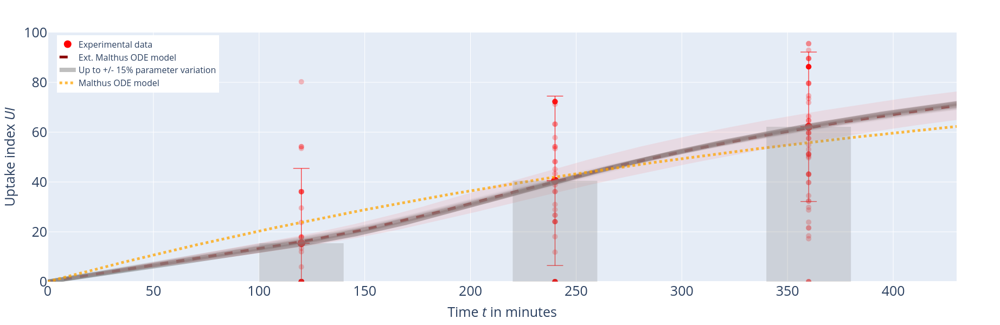

In [218]:
fig = px.scatter(x=np.array([120]), y=[-5.145], height=600, width=900, range_y=[0,100], range_x=[0, 430])

# e function for diameter independent model
def efun(r, t, deltaT):
    return (1-np.exp(-r * np.array(t/deltaT)))*100

showleg = True
xvals = np.arange(0,500, 1)

# Add datapoints of Bertuzzi
fig.add_trace(go.Scatter(x=np.ones(len(hours2))*120, y=hours2, mode='markers', marker=dict(size=10, color='red', opacity=0.25), name='Experimental data',  showlegend=False))
fig.add_trace(go.Scatter(x=np.ones(len(hours4))*240, y=hours4, mode='markers', marker=dict(size=10, color='red', opacity=0.25),  showlegend=False))
fig.add_trace(go.Scatter(x=np.ones(len(hours6))*360, y=hours6, mode='markers', marker=dict(size=10, color='red', opacity=0.25),  showlegend=False))

# Add mean values of datapoints of Bertuzzi
fig.add_trace(go.Scatter(x=np.array([120,120,120, 240,240,240, 360,360,360]), y=100*np.array([hours2mean, hours2mean, hours2mean, hours4mean, hours4mean, hours4mean, hours6mean, hours6mean, hours6mean]), error_y=dict(
        type='data',  # Data means it's an array of values, not a percentage or constant value
        array=np.array([0,30,0,0 ,34,0,0, 30,0]),
        visible=True,
        thickness=1.0,
        width=15
    ), mode='markers', marker=dict(size=14, color='red'),  name='Experimental data',  showlegend=True))


# Add models 
fig.add_trace(go.Line(x=np.arange(0, tmax, dt), y=100-np.array(para_Alives[3])*100, mode='lines',line=dict(color='darkred', width=5, dash="dash"),  name='Ext. Malthus ODE model', showlegend=showleg))


for Ali in para_Alives:
    fig.add_trace(go.Line(x=np.arange(0, tmax, dt), y=100-np.array(Ali)*100, mode='lines',line=dict(color='grey', width=8), opacity=0.05,  name='Para Variation', showlegend=False))
    
fig.add_trace(go.Line(x=np.arange(0, tmax, dt), y=100-np.array(Ali)*100, mode='lines',line=dict(color='grey', width=8), opacity=0.5,  name='Up to +/- 15% parameter variation', showlegend=True))

XX1 = np.arange(0, tmax-dt, dt)
fig.add_trace(go.Scatter(
    x=np.concatenate([XX1, XX1[::-1]]),
    y=np.concatenate([residualsUP, residualsLOW[::-1]]),
    fill='toself',
    fillcolor='rgba(255, 0, 0, 0.08)',
    line=dict(color='rgba(255,255,255,0)'),
    showlegend=False,
    name='Model uncertainty'
))


#fig.add_trace(go.Scatter(x=xvals, y=efun(0.00216, xvals, 1), name="r<sub>c-up</sub> = 0.00216 <i>min<sup>-1</sup></i>", opacity=0.25,  mode='lines',line=dict(dash='dot', color='orange', width=4)))
fig.add_trace(go.Scatter(x=xvals, y=efun(0.00227, xvals, 1), name="Malthus ODE model",  opacity=0.75, mode='lines',line=dict(dash='dot', color='orange', width=5)))
#fig.add_trace(go.Scatter(x=xvals, y=efun(0.0014, xvals, 1), name="r<sub>c-up</sub> = 0.0014 <i>min<sup>-1</sup></i>", opacity=0.15, mode='lines',line=dict(dash='dot', color='green', width=4)))


# Add bars
fig.add_shape(type="rect",x0=100,y0=0,x1=140,y1=hours2mean*100,line_width=0, fillcolor="grey", opacity=0.25)
fig.add_shape(type="rect",x0=220,y0=0,x1=260,y1=hours4mean*100,line_width=0, fillcolor="grey", opacity=0.25)
fig.add_shape(type="rect",x0=340,y0=0,x1=380,y1=hours6mean*100,line_width=0, fillcolor="grey", opacity=0.25)

fig.update_layout(
    xaxis_title="Time <i>t</i> in minutes",
    yaxis_title="Uptake index <i>UI</i>",
    font=dict(size=16),  # Change this value as needed to adjust the font size
    xaxis=dict(tickfont=dict(size=25), title_font=dict(size=25)),
    yaxis=dict(tickfont=dict(size=25), title_font=dict(size=25)),
    legend=dict(x=0.01, y=0.99),
    showlegend=True,
    title_text="",  # No title
)

fig.show()
#fig.write_image("FigureS4B_NEW.png")

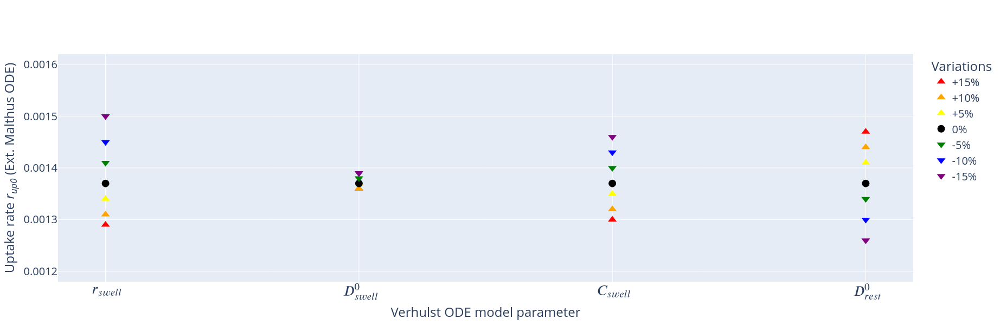

In [10]:
import plotly.graph_objs as go
import plotly.io as pio

# Sensitivity analysis results
x_values = ["$\Large{r_{swell}}$", "$\Large{D_{swell}^{0}}$", "$\Large{C_{swell}}$", "$\Large{D_{rest}^{0}}$"]
y_values = para_vals

# Percentage changes corresponding to each column
percent_changes = ['+15%', '+10%', '+5%', '0%', '-5%', '-10%', '-15%']
colors = ['red', 'orange', 'yellow', 'black', 'green', 'blue', 'purple']
symbols = ['triangle-up', 'triangle-up', 'triangle-up', 'circle', 'triangle-down', 'triangle-down', 'triangle-down']

# Create the plot
fig = go.Figure()

# Add scatter points for each percentage change
for i in range(len(percent_changes)):
    y = [y_values[j][i] for j in range(len(x_values))]
    fig.add_trace(go.Scatter(
        x=x_values,
        y=y,
        mode='markers',  # Use markers only (no lines)
        marker=dict(color=colors[i], size=14, symbol=symbols[i]),
        name=percent_changes[i]
    ))

# Set the y-axis range from 0.001 to 0.002
#fig.update_yaxes(range=[0.0012, 0.00155])

fig.update_yaxes(
    range=[0.00118, 0.00162],
    tickvals=[0.0012, 0.0013, 0.0014, 0.0015, 0.0016]
)

# Update layout
fig.update_layout(
    xaxis_title="Verhulst ODE model parameter",
    yaxis_title="Uptake rate <i>r<sub>up0</sub></i> (Ext. Malthus ODE)",
    showlegend=True,
    legend_title="Variations",
    width=800,
    height=600,
    font=dict(size=20)
)

# Show plot
pio.show(fig)
#fig.write_image("FigureS4C.png")

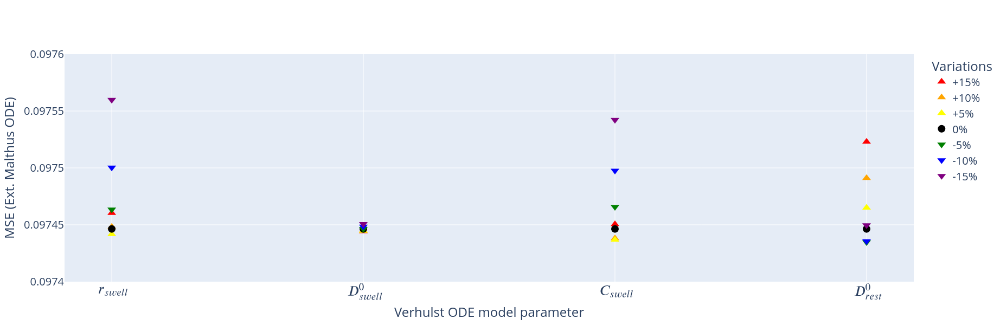

In [11]:
import plotly.graph_objs as go
import plotly.io as pio

# Sensitivity analysis results
x_values = ["$\Large{r_{swell}}$", "$\Large{D_{swell}^{0}}$", "$\Large{C_{swell}}$", "$\Large{D_{rest}^{0}}$"]
y_values = para_MSEs

# Percentage changes corresponding to each column
percent_changes = ['+15%', '+10%', '+5%', '0%', '-5%', '-10%', '-15%']
colors = ['red', 'orange', 'yellow', 'black', 'green', 'blue', 'purple']
symbols = ['triangle-up', 'triangle-up', 'triangle-up', 'circle', 'triangle-down', 'triangle-down', 'triangle-down']

# Create the plot
fig = go.Figure()

# Add scatter points for each percentage change
for i in range(len(percent_changes)):
    y = [y_values[j][i] for j in range(len(x_values))]
    fig.add_trace(go.Scatter(
        x=x_values,
        y=y,
        mode='markers',  # Use markers only (no lines)
        marker=dict(color=colors[i], size=14, symbol=symbols[i]),
        name=percent_changes[i]
    ))

# Set the y-axis range from 0.001 to 0.002
#fig.update_yaxes(range=[0.0012, 0.00155])

fig.update_yaxes(
    range=[0.0974, 0.0976],
    #tickvals=[0.0012, 0.0013, 0.0014, 0.0015, 0.0016]
)

# Update layout
fig.update_layout(
    xaxis_title="Verhulst ODE model parameter",
    yaxis_title="MSE (Ext. Malthus ODE)",
    showlegend=True,
    legend_title="Variations",
    width=800,
    height=600,
    font=dict(size=20)
)

# Show plot
pio.show(fig)
#fig.write_image("FigureS4D.png")

# Cross validation stratified by time index

In [12]:
# objective function (MSE) for screening of optimal uptake rate
def objf_CV(Alives, n):
    ss1, ss2, ss3 = 0, 0, 0
    ss1 = ((1 - Alives[int(1+(2*60)/dt)] - np.array(hours2[hours2 >= 0]/100))**2).mean() 
    ss2 = ((1 - Alives[int(1+(4*60)/dt)] - np.array(hours4[hours4 >= 0]/100))**2).mean() 
    ss3 = ((1 - Alives[int(1+(6*60)/dt)] - np.array(hours6[hours6 >= 0]/100))**2).mean()
    
    if n == 3:
        return (ss1+ss2)/2, ss3
    if n == 2:
        return (ss1+ss3)/2, ss2
    if n == 1:
        return (ss2+ss3)/2, ss1
    else:
        return (ss1+ss2+ss3)/3

In [13]:
# Parameters from Diameter ODE Model
#x: array([0.03731051, 0.00531323, 1.84056146, 2.78099417])

r_sw = 0.0373
dia0 = 0.0053
C = 1.84
D0 = 2.78

area0 = np.pi*((D0 + dia0)/2)**2

# ODE Model for uptake by AEC2
def dDiam(r, Diam):
    return r * Diam * (1 - Diam/C)
    
def dAlive(raec2, Alive, Diam):
    return - raec2 * (((Diam+D0)*(Diam+D0))/((dia0 + D0)*(dia0 + D0))) * Alive

def diamEuler(dt, Diam, r):
    Diam = Diam + dt * dDiam(r, Diam)
    return Diam

raec2 = 0.00137

# screen over uptake values 
for n in [1,2,3]:
    opt_val = 10000
    opt_val_test = 10000
    opt_raec2 = 0
    
    for raec2 in np.arange(0.001, 0.002, 0.00001):

        # Run euler to solve system of ODEs for certain raec2
        Diams = [dia0]
        AreaIncrease = [area0]
        Alives = [1.0]
        r_ = r_sw

        dt = 0.1
        tmax = 8 * 60
        for t in np.arange(0, tmax-dt, dt):
            Diam = Diams[-1] + dt * dDiam(r_, Diams[-1])
            Alive = Alives[-1] + dt * dAlive(raec2, Alives[-1],Diam)       

            Diams.append(Diam)
            Alives.append(Alive)
            AreaIncrease.append((((Diam+D0)*(Diam+D0))/4)*np.pi)#/((dia0 + D0) * (dia0 + D0))))
            
        error, testerr = objf_CV(Alives, n)

        if error < opt_val:
            opt_val = error
            opt_val_test = testerr
            opt_raec2 = raec2

    print("For testset at index =", n, ": opt parameter:", opt_raec2, " - Train MSE =", opt_val, " - Test MSE =", opt_val_test)

# Screen over values
# found raec2 = 0.00137 as best values

For testset at index = 1 : opt parameter: 0.001380000000000001  - Train MSE = 0.10156459167101639  - Test MSE = 0.08921039900532636
For testset at index = 2 : opt parameter: 0.001370000000000001  - Train MSE = 0.08830557114618665  - Test MSE = 0.11572791517659542
For testset at index = 3 : opt parameter: 0.001370000000000001  - Train MSE = 0.10246204988909763  - Test MSE = 0.08741495769077343


# For exponential model (without increasing factor)

In [14]:
# Parameters from Diameter ODE Model
#x: array([0.03731051, 0.00531323, 1.84056146, 2.78099417])

r_sw = 0.0373
dia0 = 0.0053
C = 1.84
D0 = 2.78

area0 = np.pi*((D0 + dia0)/2)**2

# ODE Model for uptake by AEC2
def dDiam(r, Diam):
    return r * Diam * (1 - Diam/C)
    
def dAlive(raec2, Alive, Diam):
    return - raec2 * 1 * Alive

def diamEuler(dt, Diam, r):
    Diam = Diam + dt * dDiam(r, Diam)
    return Diam

raec2 = 0.00137

# screen over uptake values 
opt_val = 10000
opt_raec2 = 0

for raec2 in np.arange(0.001, 0.003, 0.00001):

    # Run euler to solve system of ODEs for certain raec2
    Diams = [dia0]
    AreaIncrease = [area0]
    Alives = [1.0]
    r_ = r_sw

    dt = 0.1
    tmax = 8 * 60
    for t in np.arange(0, tmax-dt, dt):
        Diam = Diams[-1] + dt * dDiam(r_, Diams[-1])
        Alive = Alives[-1] + dt * dAlive(raec2, Alives[-1],Diam)       

        Diams.append(Diam)
        Alives.append(Alive)
        AreaIncrease.append((((Diam+D0)*(Diam+D0))/4)*np.pi)#/((dia0 + D0) * (dia0 + D0))))

    error = objf_CV(Alives, 0)

    if error < opt_val:
        opt_val = error
        opt_raec2 = raec2

print("opt parameter:", opt_raec2, " - Train MSE =", opt_val)

# Screen over values
# found raec2 = 0.00137 as best values

opt parameter: 0.0022700000000000034  - Train MSE = 0.10119324581701933


In [15]:
# Parameters from Diameter ODE Model
#x: array([0.03731051, 0.00531323, 1.84056146, 2.78099417])

r_sw = 0.0373
dia0 = 0.0053
C = 1.84
D0 = 2.78

area0 = np.pi*((D0 + dia0)/2)**2

# ODE Model for uptake by AEC2
def dDiam(r, Diam):
    return r * Diam * (1 - Diam/C)
    
def dAlive(raec2, Alive, Diam):
    return - raec2 * 1.0 * Alive

def diamEuler(dt, Diam, r):
    Diam = Diam + dt * dDiam(r, Diam)
    return Diam

raec2 = 0.00137

# screen over uptake values 
for n in [1,2,3]:
    opt_val = 10000
    opt_val_test = 10000
    opt_raec2 = 0
    
    for raec2 in np.arange(0.001, 0.003, 0.00001):

        # Run euler to solve system of ODEs for certain raec2
        Diams = [dia0]
        AreaIncrease = [area0]
        Alives = [1.0]
        r_ = r_sw

        dt = 0.1
        tmax = 8 * 60
        for t in np.arange(0, tmax-dt, dt):
            Diam = Diams[-1] + dt * dDiam(r_, Diams[-1])
            Alive = Alives[-1] + dt * dAlive(raec2, Alives[-1],Diam)       

            Diams.append(Diam)
            Alives.append(Alive)
            AreaIncrease.append((((Diam+D0)*(Diam+D0))/4)*np.pi)#/((dia0 + D0) * (dia0 + D0))))
            
        error, testerr = objf_CV(Alives, n)

        if error < opt_val:
            opt_val = error
            opt_val_test = testerr
            opt_raec2 = raec2

    print("For testset at index =", n, ": opt parameter:", opt_raec2, " - Train MSE =", opt_val, " - Test MSE =", opt_val_test)

# Screen over values
# found raec2 = 0.00137 as best values

For testset at index = 1 : opt parameter: 0.002450000000000004  - Train MSE = 0.10298611508925455  - Test MSE = 0.099235568693183
For testset at index = 2 : opt parameter: 0.0023400000000000035  - Train MSE = 0.09373381614322132  - Test MSE = 0.1163481443103219
For testset at index = 3 : opt parameter: 0.0019300000000000025  - Train MSE = 0.1043889402146327  - Test MSE = 0.10196003957177256


# Model estimations for literature values

In [16]:
# Parameters from Diameter ODE Model
#x: array([0.03731051, 0.00531323, 1.84056146, 2.78099417])

r_sw = 0.0373
dia0 = 0.0053
C = 1.84
D0 = 2.78

area0 = np.pi*((D0 + dia0)/2)**2

# ODE Model for uptake by AEC2
def dDiam(r, Diam):
    return r * Diam * (1 - Diam/C)
    
def dAlive(raec2, Alive, Diam):
    return - raec2 * (((Diam+D0)*(Diam+D0))/((dia0 + D0)*(dia0 + D0))) * Alive

def diamEuler(dt, Diam, r):
    Diam = Diam + dt * dDiam(r, Diam)
    return Diam

raec2 = 0.00137

for lit_val, timepoint in zip([0.62, 0.02, 0.18, 0.44, 0.72, 0.92, 0.98, 0.9, 0.22, 0.48, 0.75, 0.81, 0.3, 0.78, 0.85],[6, 6, 6, 6, 6, 6, 6, 4, 6, 6, 4, 4, 6, 5, 5]):
    opt_val = 10000
    opt_raec2 = 0

    # screen over uptake values 
    for raec2 in np.arange(0.00001, 0.009, 0.00001):

        # Run euler to solve system of ODEs for certain raec2
        Diams = [dia0]
        AreaIncrease = [area0]
        Alives = [1.0]
        r_ = r_sw

        dt = 0.1
        tmax = 8 * 60
        for t in np.arange(0, tmax-dt, dt):
            Diam = Diams[-1] + dt * dDiam(r_, Diams[-1])
            Alive = Alives[-1] + dt * dAlive(raec2, Alives[-1],Diam)       

            Diams.append(Diam)
            Alives.append(Alive)
            AreaIncrease.append((((Diam+D0)*(Diam+D0))/4)*np.pi)#/((dia0 + D0) * (dia0 + D0))))

        error = ((1-Alives[int(1+(timepoint*60)/dt)]) - lit_val)**2

        if error < opt_val:
            opt_val = error
            opt_raec2 = raec2

    print(lit_val, "in", timepoint, "h ## optimal parameter:", opt_raec2, " - MSE =", opt_val)
        
# Screen over values
# found raec2 = 0.00137 as best values

0.62 in 6 h ## optimal parameter: 0.0013700000000000001  - MSE = 1.7753079662072531e-06
0.02 in 6 h ## optimal parameter: 3.0000000000000004e-05  - MSE = 7.866864208699301e-07
0.18 in 6 h ## optimal parameter: 0.00028000000000000003  - MSE = 1.388250434239155e-06
0.44 in 6 h ## optimal parameter: 0.0008200000000000001  - MSE = 2.484955214517212e-06
0.72 in 6 h ## optimal parameter: 0.0018100000000000002  - MSE = 5.1827826909690314e-08
0.92 in 6 h ## optimal parameter: 0.0035900000000000003  - MSE = 9.493165509427416e-09
0.98 in 6 h ## optimal parameter: 0.00556  - MSE = 2.3717159529916866e-09
0.9 in 4 h ## optimal parameter: 0.0061200000000000004  - MSE = 1.2615667901351115e-09
0.22 in 6 h ## optimal parameter: 0.00035000000000000005  - MSE = 2.9258793560383493e-06
0.48 in 6 h ## optimal parameter: 0.00093  - MSE = 6.555422066803159e-08
0.75 in 4 h ## optimal parameter: 0.00369  - MSE = 1.427503784902257e-07
0.81 in 4 h ## optimal parameter: 0.00442  - MSE = 1.0872629937849975e-07
0.3 